<img src="https://media-exp1.licdn.com/dms/image/C4E1BAQF_UpI5AaG0tQ/company-background_10000/0/1652085437382?e=2147483647&v=beta&t=i5HS1izIkIk8HRtK0OPS6odEgZpuVbjjfcH2wx6ByAI" alt="MarineGEO circle logo"/>

# MBIT School

## Máster Profesional en Data Science e Inteligencia Artificial

---

### **Módulo 2. Estadística Descriptiva y Diferencial**
#### **Sesión 2. Análisis Exploratorio y Limpieza de Datos**

---

Robert Gavilanes (robert.gavilanes@mbitschool.com)

---

---

### Alumno: Jorge Blanco (jorgeluis.blanco@alu.mbitschool.com) ###

### Version 1.0 (03/07/2024) ###

--- 

In [3]:
# Importación de los módulos principales
import pandas as pd
import numpy as np

# Ajustamos la configuración de jupyter para que podamos ver más filas y columnas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Descripcion del problema

En este caso vamos a trabajar con un dataset que incluye detalles de todos los listados de Airbnb en la ciudad de Nueva York en 2023. Este conjunto de datos proporciona información detallada sobre cada listado, incluyendo el precio por noche, el número mínimo de noches requeridas, el total de reseñas recibidas, el promedio de reseñas por mes, el número de listados gestionados por el anfitrión y la disponibilidad del listado en un año. Este dataset es ideal para realizar análisis exploratorios y construir modelos de machine learning que pueden ayudar a predecir precios, evaluar la demanda, y analizar patrones de comportamiento de los huéspedes y anfitriones.

Podéis encontrar más información acerca de los datos en: [New York City Airbnb 2023, Public Data](https://www.kaggle.com/datasets/godofoutcasts/new-york-city-airbnb-2023-public-data).

Para conocer mejor los campos que conforman este dataset también podemos acudir a la [exploración de datos en Kaggle](https://www.kaggle.com/code/dgomonov/data-exploration-on-nyc-airbnb).

Este dataset permite un análisis profundo de los listados de Airbnb en Nueva York y puede ser utilizado para varios fines analíticos y predictivos, incluyendo la discretización de variables clave para mejorar la precisión de los modelos predictivos.

## Ejercicio 1

Visualiza los datos. Carga el dataset y muestra las primeras 30 filas

In [8]:
# (1.1) Carga de los datos:

df_room = (
    pd.read_csv('./data/NYC-Airbnb-2023.csv')
)

C:\Users\PC\AppData\Local\Temp\ipykernel_2584\2861003193.py:4: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  pd.read_csv('./data/NYC-Airbnb-2023.csv')


Comprueba el esquema de los datos, ¿Lo ves correcto? Si crees que hace falta alguna modificación implementala si fuera necesario

In [10]:
# (1.2) Visualización de las 30 primeras filas:

df_room.head(30)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.753560,-73.985590,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.685350,-73.955120,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.803800,-73.967510,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.764570,-73.983170,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN
4,5136,"Large Sunny Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.662650,-73.994540,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1,NaN
5,29628,"Comfortable, Sunny Room",127608,Chris,Brooklyn,Clinton Hill,40.682920,-73.963810,Private room,93,3,350,2023-02-27,2.25,1,145,48,NaN
6,5586,Rooftop Deck/City Views. Great Apt,8526,Susan,Manhattan,Upper East Side,40.760760,-73.961560,Entire home/apt,295,4,45,2022-10-03,0.27,1,1,4,NaN
7,5803,"Lovely, Cozy, Room 1, BEST AREA; Legal Rental",9744,Laurie,Brooklyn,South Slope,40.668010,-73.987840,Private room,124,3,223,2023-02-13,1.32,3,164,17,NaN
8,31130,Most Central Location!,117287,Lara Nicole,Manhattan,Hell's Kitchen,40.767200,-73.984640,Private room,200,1,68,2021-10-01,0.44,4,310,0,NaN
9,6848,Only 2 stops to Manhattan studio,15991,Allen & Irina,Brooklyn,Williamsburg,40.709350,-73.953420,Entire home/apt,81,30,189,2023-02-04,1.13,1,207,5,NaN


In [11]:
# (1.3) Informaciuón y tipos de las columnas:

df_room.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42931 entries, 0 to 42930
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              42931 non-null  int64  
 1   name                            42919 non-null  object 
 2   host_id                         42931 non-null  int64  
 3   host_name                       42926 non-null  object 
 4   neighbourhood_group             42931 non-null  object 
 5   neighbourhood                   42931 non-null  object 
 6   latitude                        42931 non-null  float64
 7   longitude                       42931 non-null  float64
 8   room_type                       42931 non-null  object 
 9   price                           42931 non-null  int64  
 10  minimum_nights                  42931 non-null  int64  
 11  number_of_reviews               42931 non-null  int64  
 12  last_review                     

In [12]:
# (1.4) Descripción y características de las variables numéricas:

df_room.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,4.293100e+04,4.293100e+04,42931.000000,42931.000000,42931.000000,42931.000000,42931.000000,32627.000000,42931.000000,42931.000000,42931.000000
mean,2.222772e+17,1.516012e+08,40.728273,-73.943665,200.307167,18.111178,25.856001,1.168988,24.054809,140.262211,7.736507
std,3.344213e+17,1.621301e+08,0.057640,0.056627,895.082911,27.462513,56.616344,1.789675,80.867958,142.001486,18.290256
min,2.595000e+03,1.678000e+03,40.500314,-74.251907,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,1.940474e+07,1.608533e+07,40.687485,-73.981750,75.000000,2.000000,1.000000,0.140000,1.000000,0.000000,0.000000
50%,4.337482e+07,7.433812e+07,40.724040,-73.952620,125.000000,7.000000,5.000000,0.520000,1.000000,89.000000,0.000000
75%,6.305016e+17,2.680692e+08,40.762293,-73.924035,200.000000,30.000000,24.000000,1.670000,4.000000,289.000000,7.000000
max,8.404660e+17,5.038729e+08,40.911380,-73.710870,99000.000000,1250.000000,1842.000000,86.610000,526.000000,365.000000,1093.000000


## Ejercicio 2.

¿Cual es el volumen de datos faltantes?. Representa el resultado final en porcentajes

In [15]:
# (2.1) Dimesniones del DF, para saber la cantidad de inputs que tenemos (42931 muestras, 18 variables):

df_room.shape

(42931, 18)

In [16]:
# (2.2) Cálculo de datos faltantes por cada variable en porcentaje:

df_room.isna().sum()/(len(df_room))*100

id                                 0.000000
name                               0.027952
host_id                            0.000000
host_name                          0.011647
neighbourhood_group                0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       24.001304
reviews_per_month                 24.001304
calculated_host_listings_count     0.000000
availability_365                   0.000000
number_of_reviews_ltm              0.000000
license                           99.997671
dtype: float64

En el caso concreto de `license`, ¿tienen sentido todos los valores nulos?

In [18]:
df_room["license"].dropna()

10101    41662/AL
Name: license, dtype: object

*--> Sólo una fila contiene el valor de licencia. No afectaría el análisis dicha columna y podría eliminarse*

## Ejercicio 3.

Trata de explicar el motivo de valores faltantes. ¿Crees que existe alguna relación entre los valores faltantes de `reviews_per_month` y la columna `last_review` ?.
Ambas columas presentan datos faltantes

In [22]:
# (3.1) Para comparar los nulos de dichas columnas, primero hacemos un filtrado de las muestras con "last_review" nulas:

valid_last = df_room[df_room['last_review'].isna()]
valid_last.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
15,68253,Room in the heart of Astoria,67730,Boris,Queens,Astoria,40.76336,-73.92099,Private room,55,30,0,NaN,NaN,1,0,0,NaN
47,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,30,0,NaN,NaN,1,0,0,NaN
88,45935,Room in Beautiful Townhouse.,204586,L,Bronx,Mott Haven,40.80635,-73.92201,Private room,60,30,0,NaN,NaN,1,83,0,NaN
101,51438,1 Bedroom in 2 Bdrm Apt- Upper East,236421,Jessica,Manhattan,Upper East Side,40.77449,-73.95308,Private room,130,14,0,NaN,NaN,2,0,0,NaN
114,54466,Beautiful Uptown Manhattan apartmnt,253385,Douglas,Manhattan,Harlem,40.80255,-73.95803,Private room,200,30,0,NaN,NaN,1,365,0,NaN


In [23]:
# (3.2) Luego, sobre este data frame contamos los valores no-nulos de la otra columna "number_of_reviews":

valid_last["number_of_reviews"].sum()

0

*--> Al parecer son columnas idénticas y ambas dependen de la columna number_of_reviews con valor "0", lo cual tiene todo el sentido*



Intenta realizar otro análisis para detectar las columnas que aporten mayor valor y elige un caso en concreto de columnas que tengan relación entre ellas. Justifica la respuesta.

In [26]:
# (3.3) Definimos la columna de última reseña como variable de tiempo:

df_room["last_review"] = df_room["last_review"].apply (pd.to_datetime, format = '%Y-%m-%d')

<Axes: >

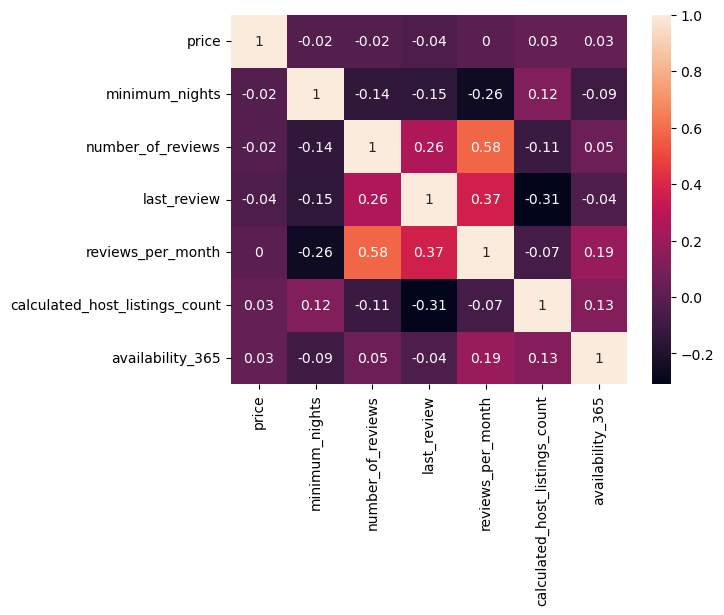

In [27]:
# (3.4) Generamos un mapa de calor preliminar para ver relaciones entre las columnas numéricas del DS original:

import seaborn as sns

corr_mat = df_room.iloc[:, 9:16].corr().round(2)
sns.heatmap(data=corr_mat, annot=True)

*--> A simple vista las únicas correlaciones medianamente relevantes son las referentes a las reseñas. En caso de necesitarse una reducción de variables, podría seleccionarse una de ellas: "reviews_per_month", pues es la que mejor correlaciona con las otras dos. Lo anterior, claro está, a expensas de perder cierta información.*

## Ejercicio 4. 

Como vimos durante la sesión eliminar datos faltantes no es buena opción si no se hace bajo un buen criterio. Dependiendo del caso de uso se puede usar el método de rellenar valores faltantes de forma automática (uso del método bfill por ejemplo).
Reemplaza los valores nulos del dataframe `room` con un 0. Almacena el resultado en una variable llamada df_room_with_na_dropped

In [31]:
# (4.1) Definimos un DS nuevo para transformar los datos y no afectar el original. Rellenamos con 0 los NaN de "reviews_per_month":

df_room_with_na_dropped = df_room
df_room_with_na_dropped["reviews_per_month"] = df_room_with_na_dropped["reviews_per_month"].fillna(0)
df_room_with_na_dropped.head(16) #la fila 15 contiene valores tipo NaN. Verificar el cambio:

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN
4,5136,"Large Sunny Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1,NaN
5,29628,"Comfortable, Sunny Room",127608,Chris,Brooklyn,Clinton Hill,40.68292,-73.96381,Private room,93,3,350,2023-02-27,2.25,1,145,48,NaN
6,5586,Rooftop Deck/City Views. Great Apt,8526,Susan,Manhattan,Upper East Side,40.76076,-73.96156,Entire home/apt,295,4,45,2022-10-03,0.27,1,1,4,NaN
7,5803,"Lovely, Cozy, Room 1, BEST AREA; Legal Rental",9744,Laurie,Brooklyn,South Slope,40.66801,-73.98784,Private room,124,3,223,2023-02-13,1.32,3,164,17,NaN
8,31130,Most Central Location!,117287,Lara Nicole,Manhattan,Hell's Kitchen,40.76720,-73.98464,Private room,200,1,68,2021-10-01,0.44,4,310,0,NaN
9,6848,Only 2 stops to Manhattan studio,15991,Allen & Irina,Brooklyn,Williamsburg,40.70935,-73.95342,Entire home/apt,81,30,189,2023-02-04,1.13,1,207,5,NaN


In [32]:
# (4.2) Definimos la columna de última reseña como variable de tiempo:

df_room_with_na_dropped["last_review"] = df_room_with_na_dropped["last_review"].apply (pd.to_datetime, format = '%Y-%m-%d')

In [33]:
# (4.3) Los valores NaN (sin fecha o sin reseñas) los remplazamos por la fecha de reseña más antigua en el DS:

df_room_with_na_dropped["last_review"] = df_room_with_na_dropped["last_review"].fillna(df_room_with_na_dropped["last_review"].min())
df_room_with_na_dropped["last_review"].head(16) #fila 15 corrobora el remplazo OK:

0    2022-06-21
1    2019-12-02
2    2017-07-21
3    2023-02-19
4    2022-08-10
5    2023-02-27
6    2022-10-03
7    2023-02-13
8    2021-10-01
9    2023-02-04
10   2022-06-05
11   2022-12-14
12   2021-03-27
13   2022-06-26
14   2019-10-14
15   2011-05-12
Name: last_review, dtype: datetime64[ns]

In [34]:
# (4.4) Comprobamos que efectivamente no queden NaN:

df_room_with_na_dropped["last_review"].isna().sum()

0

*--> Aún quedan las columnas de name y host_name con unos cuantos NaN, pero de momento no se transforman al no suponer variables de consideración para el análisis*

## Ejercicio 5. 

Una vez identificamos valores perdidos y algunos métodos para poder rellenarlo hay que trabajar los valores atípicos.
Realiza un análisis de valores atípicos, obteniendo el tipo de columnas y en caso de encontrar alguna columna con valores atípicos define una estrategia para obtener esos valores y representarlos gráficamente en un histograma.

C:\Users\PC\AppData\Local\Temp\ipykernel_2584\25991879.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_room_with_na_dropped["price"], bins=100)


<Axes: xlabel='price', ylabel='Density'>

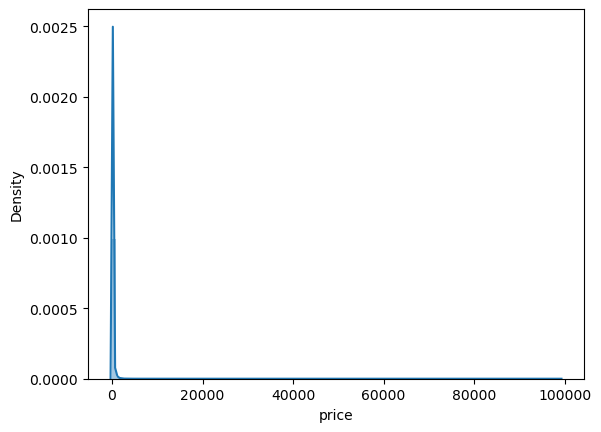

In [38]:
# (5.1.1) Precios: Distribución

import seaborn as sns

sns.distplot(df_room_with_na_dropped["price"], bins=100)

#Al revisar la columna price vemos que hay alguno(os) valores exagerados, el máximo en el describe es de 99K:

In [39]:
# (5.1.2) Vemos los 10 valores más altos por hacernos una idea

df_room_with_na_dropped["price"].nlargest(10) 

34299    99000
32440    85170
34929    85100
9418     65115
9809     20500
31388    19750
33266    15000
2796     10000
8421     10000
12643    10000
Name: price, dtype: int64

In [40]:
df_room_with_na_dropped.iloc[34299]

#revisamos el valor más alto por si tuviese más datos inconsistentes,
#pero al parecer todo es correcto a pesar de su precio y lo mantendríamos por no sesgar el conjunto.

id                                        683438366892259448
name                              46th Floor Private Rooftop
host_id                                            472600679
host_name                                              Alisa
neighbourhood_group                                 Brooklyn
neighbourhood                                   Williamsburg
latitude                                            40.71578
longitude                                          -73.96657
room_type                                    Entire home/apt
price                                                  99000
minimum_nights                                             1
number_of_reviews                                          1
last_review                              2022-08-18 00:00:00
reviews_per_month                                       0.15
calculated_host_listings_count                             1
availability_365                                         365
number_of_reviews_ltm   

In [41]:
# (5.1.3) En caso de distorsionar mucho podríamos considerar el valor del 98% de la distribución, más o menos unos 900 USD

df_room_with_na_dropped["price"].quantile(0.98)

878.4000000000015

In [42]:
q98_p = df_room_with_na_dropped[df_room_with_na_dropped['price'] <= df_room_with_na_dropped['price'].quantile(0.98)]

<Axes: xlabel='price', ylabel='Count'>

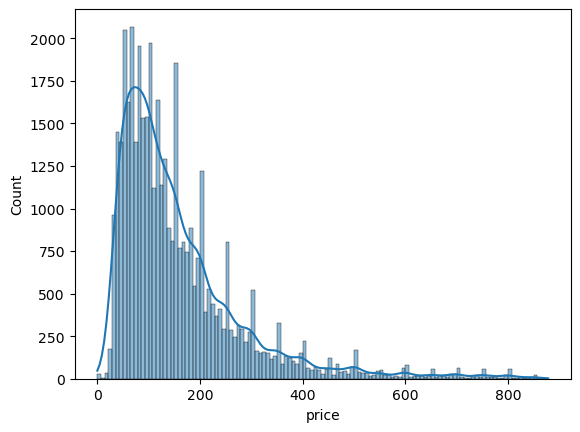

In [43]:
# (5.1.4) Nueva gráfica de precios descartando posibles outliers

sns.histplot(q98_p['price'], kde=True) #histograma para el 98% de la distribución:

*Más allá del análisis general de precios, se podría desglosar mejor por tipo de habitación o por barrio / grupo de barrio:*

In [45]:
# (5.1.5) Visualizamos media y mediana (distribución no uniforme) de precio por tipo de alojamiento

print(df_room_with_na_dropped.groupby("room_type").agg(mean_price=("price", "mean")), "\n\n")
print(df_room_with_na_dropped.groupby("room_type").agg(median_price=("price", "median")))

                 mean_price
room_type                  
Entire home/apt  249.255365
Hotel room       309.959391
Private room     135.015046
Shared room      126.250000 


                 median_price
room_type                    
Entire home/apt         174.0
Hotel room              240.0
Private room             73.0
Shared room              56.5


In [46]:
# (5.1.6) Media y mediana de precio por grupo de barrio

print(df_room_with_na_dropped.groupby("neighbourhood_group").agg(mean_price=("price", "mean")), "\n\n")
print(df_room_with_na_dropped.groupby("neighbourhood_group").agg(median_price=("price", "median")))

                     mean_price
neighbourhood_group            
Bronx                117.512123
Brooklyn             162.766829
Manhattan            268.365783
Queens               128.173655
Staten Island        309.037296 


                     median_price
neighbourhood_group              
Bronx                        87.0
Brooklyn                    110.0
Manhattan                   165.0
Queens                       90.0
Staten Island                99.0


<Axes: xlabel='minimum_nights', ylabel='Count'>

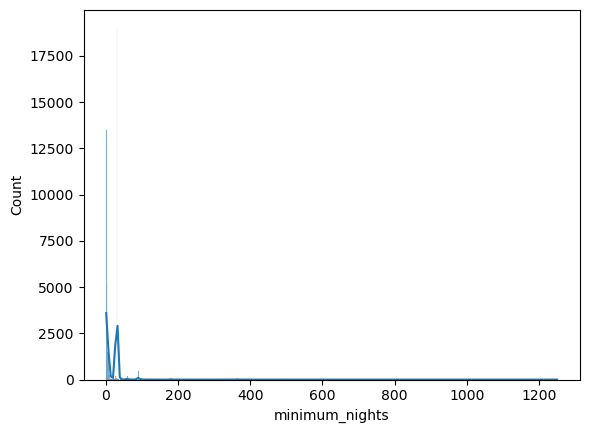

In [47]:
# (5.2.1) Similar a lo anterior, analizamos la variable minimum_nights

sns.histplot(df_room_with_na_dropped["minimum_nights"], kde=True)

In [48]:
df_room_with_na_dropped["minimum_nights"].nlargest(10)

2721     1250
2186     1124
19718    1000
19827    1000
15540     999
3536      500
3866      500
5396      500
6860      500
17922     500
Name: minimum_nights, dtype: int64

In [49]:
# (5.2.2) En caso de distorsionar mucho podríamos considerar el valor del 98% de la distribución, 60 noches

df_room_with_na_dropped["minimum_nights"].quantile(0.98)

60.0

In [50]:
q98_mn = df_room_with_na_dropped[df_room_with_na_dropped['minimum_nights'] <= df_room_with_na_dropped['minimum_nights'].quantile(0.98)]

<Axes: xlabel='minimum_nights', ylabel='Count'>

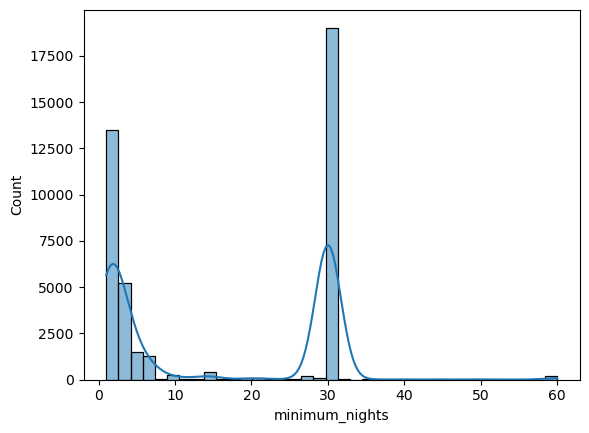

In [51]:
sns.histplot(q98_mn['minimum_nights'], kde=True) #histograma para el 98% de la distribución:

*--> Se observa por la grafica anterior que el alquiler mensual es el más común (moda)*

<Axes: xlabel='reviews_per_month', ylabel='Count'>

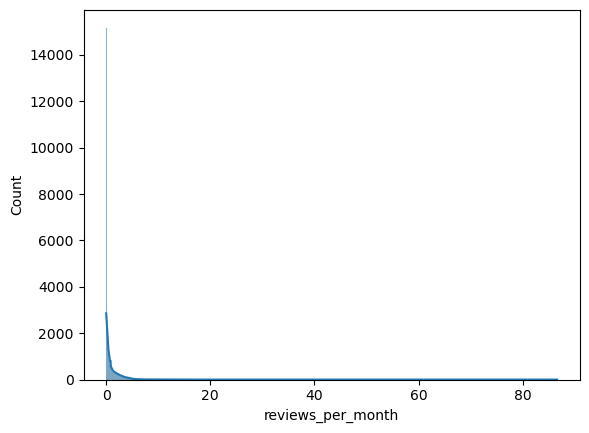

In [53]:
# (5.3.1) Una tercera variable llamativa es reviews_per_month:

sns.histplot(df_room_with_na_dropped["reviews_per_month"], kde=True)

In [54]:
df_room_with_na_dropped["reviews_per_month"].nlargest(10)

28896    86.61
22047    61.26
34783    55.46
26714    51.71
24742    45.53
24749    43.75
18216    40.78
25230    36.94
30736    35.96
37909    33.81
Name: reviews_per_month, dtype: float64

In [55]:
# (5.3.2) En caso de distorsionar mucho podríamos considerar el valor del 98% de la distribución, 5 reseñas. Claramente un valor superior a 20 ya es sospechoso...

df_room_with_na_dropped["reviews_per_month"].quantile(0.98)

5.0140000000000144

In [56]:
q98_rpm = df_room_with_na_dropped[df_room_with_na_dropped['reviews_per_month'] <= df_room_with_na_dropped['reviews_per_month'].quantile(0.98)]

<Axes: xlabel='reviews_per_month', ylabel='Count'>

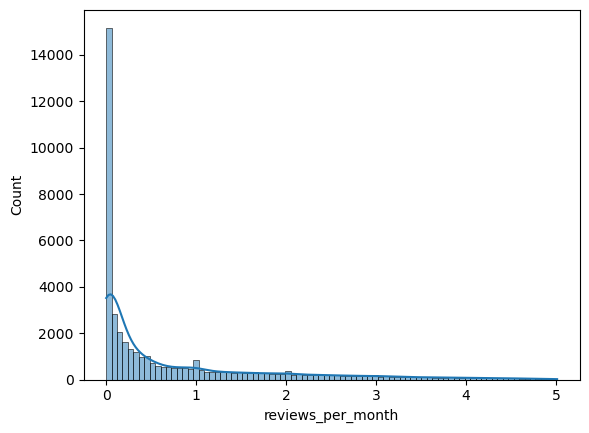

In [172]:
sns.histplot(q98_rpm['reviews_per_month'], kde=True) #histograma para el 98% de la distribución, la gran mayoría no tiene reseñas:

<Axes: xlabel='longitude', ylabel='latitude'>

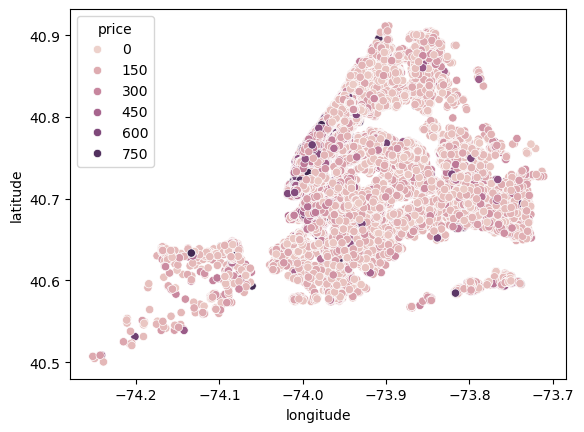

In [58]:
# (5.4.1) En cuanto a coordenadas, podríamos graficar scatters de acuerdo a precio y ocupación (usamos cuartiles 98%)

sns.scatterplot(x=q98_p["longitude"], y=q98_p["latitude"], hue=q98_p["price"])

# POR PRECIO. TAL VEZ RESULTE CONVENIENTE DISCRETIZAR EL PRECIO Y GRAFICARLO MÁS ADELANTE (Ejercicio 7.1.3):

<Axes: xlabel='longitude', ylabel='latitude'>

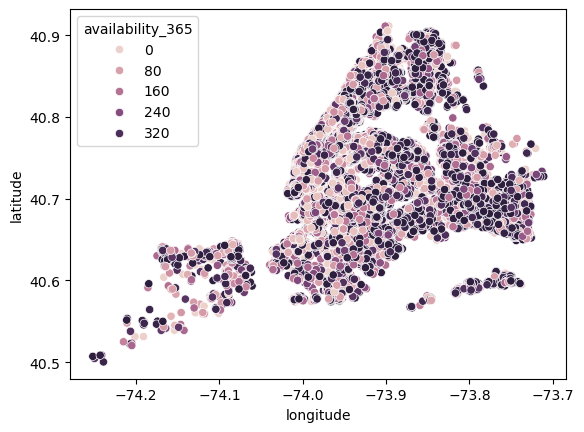

In [59]:
# (5.4.2) Distribución geográfica por disponibilidad:

sns.scatterplot(x=df_room_with_na_dropped["longitude"], y=df_room_with_na_dropped["latitude"], hue=df_room_with_na_dropped["availability_365"])

## Ejercicio 6.

Realiza un perfilado de los datos usando las técnicas o herramientas que consideres y explica qué conclusiones obtienes tras realizar el perfilado.

In [62]:
from ydata_profiling import ProfileReport

original_report = ProfileReport(df_room_with_na_dropped, title='DF NaN dropped')

In [63]:
original_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**(6.1) Conclusiones Perfilado:**

*(1) Overview: tipos de variables, valores faltantes, alertas.*

*(2) Variable nombre: las palabras más comunes (keywords a modo marketing), pestaña Words.*

*(3) Variable host_id: se observan los 10 hosts con más avisos (more details/common values). 107434423 tiene 526 avisos con el 1.2% de cuota.*

*(4) Variable neighbourhood_group: muestra valores absolutos y porcentajes de avisos por sector de NY. Manhattan y Brooklyn acaparan casi el 80% de la oferta.*

*(5) Variables lat. y long.: nos pueden dar una idea de la concentración de hospedajes según ubicación.*

*(6) Variable room_type: valores absolutos y porcentajes de avisos por tipo.*

*(7) Variable price: resumen muy ilustrativo. Se ve una distribución muy asimetrica debido a unos máximos desorbitados que desvirtuan la visualización de histograma.*

*(8) Similar al punto anterior ocurre con las variables reviews_per_month y minimum_nights.*

*(9) Variable availability_365: buen resumen general de la ocupación, se observa que un tercio de la oferta está copada todo el año.*

## Ejercicio 7.

Sabemos que los datos una vez limpios, se pueden usar para entrenar modelos de ML, pero antes de ello hay que cocinar un poco más los datos para que el modelo entienda correctamente los datos de entrada.
Trata de discretizar 2 de las siguientes columnas que se propone a continuación:
- `Price` : Precio por noche
    `Tipo Discretizacion`: Puedes agrupar los precios en rangos 

- `minimum_nights`: Número mínimo de noches para reservar
    `Discretizacion`: Puedes crear categorías como 1-3, 4-7, 8-14, etc.

- `number_of_reviews`: Número total de reseñas
     `Discretizacion` : Puedes agruparlo en intervalos como por ejemplo 0-10,   11-50, 51-100 etc

- `reviews_per_month`: Promedio de reseñas por mes.
     `Discretizacion` : Puedes divirlo en categorías como 0-1, 1-2, etc

- `availability_365`: Número de días que el listado está disponible en un año
    `Discretización`: Crear categorías como 0-100, 101-200 etc

- `last_review`: Fecha de la última reseña
     `Discretizacion`: Puedes extraer el año, mes y día y sustituir los meses por angulos para calcular el seno y coseno.

In [67]:
# (7.1.1) DISCRETIZAMOS PRICE:

p_range = [0, 100, 400, 1000, 100000] #Definimos unos rangos de precio (arbitrarios, sin considerar Qs, std, etc.)
p_cat = ['low', 'mid', 'high', 'luxury'] #Definimos las correspondientes categorías

df_room_with_na_dropped['price_category'] = pd.cut(df_room_with_na_dropped['price'], p_range, labels=p_cat) #Generamos la nueva columna

df_room_with_na_dropped.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,price_category
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN,mid
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN,low
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN,low
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN,low
4,5136,"Large Sunny Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1,NaN,mid


<Axes: xlabel='price_category', ylabel='Count'>

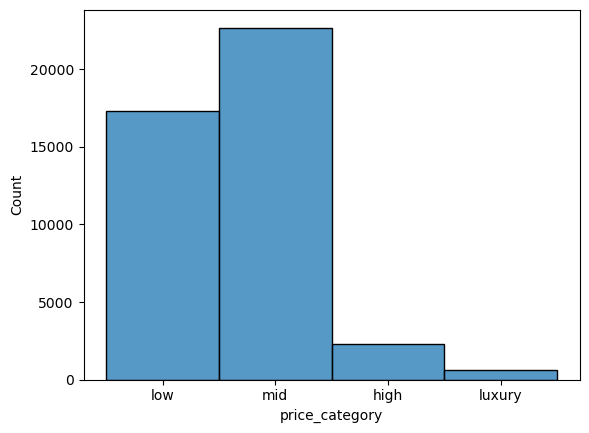

In [68]:
# (7.1.2) Vemos la distribución por categoría de precio

sns.histplot(df_room_with_na_dropped['price_category'])

<Axes: xlabel='longitude', ylabel='latitude'>

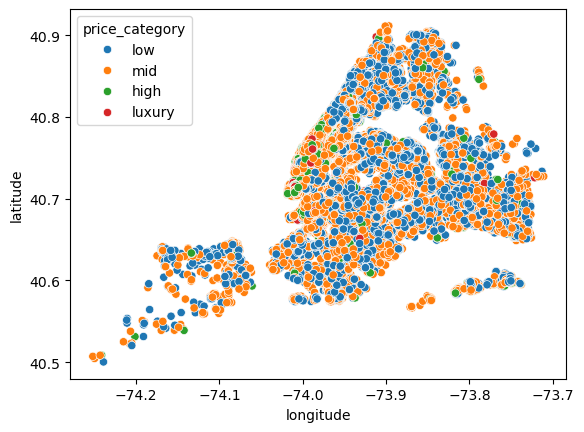

In [69]:
# (7.1.3) Vemos que resulta más cómodo de visualizar la distribución geográfica por precios tras la discretización:

sns.scatterplot(x=df_room_with_na_dropped["longitude"], y=df_room_with_na_dropped["latitude"], hue=df_room_with_na_dropped["price_category"])

In [70]:
# (7.2.1) DISCRETIZAMOS LAST REVIEW PARA HACERNOS UNA IDEA (APROXIMADA) DE LOS MESES CON MÀS HUÉSPEDES

df_room_with_na_dropped["Review Month"] = df_room_with_na_dropped["last_review"].dt.month

<Axes: xlabel='Review Month', ylabel='Count'>

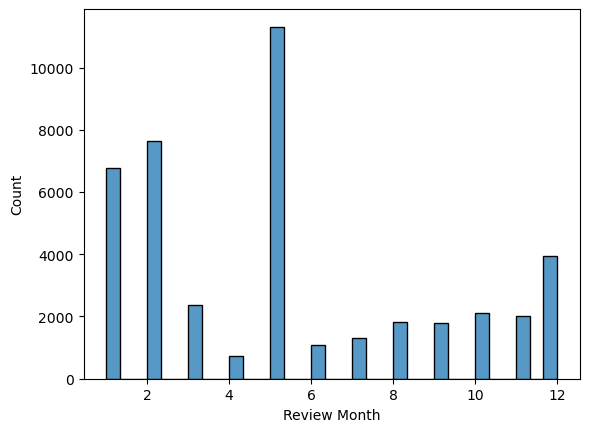

In [71]:
# (7.2.2) Vemos la distribución de reseñas por meses. Al parecer mayo es el mes más "agitado".

sns.histplot(df_room_with_na_dropped['Review Month'])

## Ejercicio 8

Como hemos visto en clase, se puede enriquecer el contenido del dataset cuando añades datos adicionales que pueden favorecer tu caso de uso en concreto. Elige una fuente de datos (libre elección) e intenta unirla a tu conjunto de datos original. Recuerda que puedes usar columnas que unen la información a otros datos reales como pueden ser direcciones, coordenadas geoespaciales para representarlas en un mapa etc.

In [74]:
# (8.1) Intentaremos hacer un matching de los barrios con los datos públicos de población.
# Primero analizamos los de nuestro DS:

print("Barrios:", df_room_with_na_dropped.neighbourhood.nunique(), "\n")
df_room_with_na_dropped.neighbourhood.unique()

Barrios: 223 



array(['Midtown', 'Bedford-Stuyvesant', 'Upper West Side', 'Sunset Park',
       'Clinton Hill', 'Upper East Side', 'South Slope', "Hell's Kitchen",
       'Williamsburg', 'East Harlem', 'West Village', 'East Flatbush',
       'Astoria', 'Greenpoint', 'Nolita', 'Fort Greene',
       'Prospect Heights', 'Washington Heights', 'Boerum Hill', 'Harlem',
       'Chinatown', 'Greenwich Village', 'Kingsbridge', 'Bushwick',
       'Flatbush', 'Sunnyside', 'East Village', 'Long Island City',
       'Lower East Side', 'Carroll Gardens', 'St. George', 'Chelsea',
       'Park Slope', 'Ridgewood', 'Mott Haven', 'Morningside Heights',
       'Gowanus', 'Crown Heights', 'Kips Bay', 'Ditmars Steinway',
       'Middle Village', 'Jamaica', 'Brooklyn Heights', 'Rockaway Beach',
       'Flatiron District', 'Windsor Terrace', 'Tribeca', 'Clason Point',
       'Eastchester', 'Forest Hills', 'Murray Hill', 'University Heights',
       'Gravesend', 'Shore Acres', 'Allerton', 'Richmond Hill',
       'Woodside',

In [75]:
# (8.2) Cargamos un dataset externo con los datos de población por barrios:
# https://data.cityofnewyork.us/City-Government/New-York-City-Population-By-Neighborhood-Tabulatio/swpk-hqdp/about_data

df_nyc_pop =  pd.read_csv('./data/NYC_Population_By_Neighborhood.csv')
df_nyc_pop.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [76]:
# (8.3) Seleccionamos las columnas que nos interesan: NTA y Population

df_nyc_pop_drop = df_nyc_pop.drop(df_nyc_pop.columns[[0,1,2,3]], axis=1)

df_nyc_pop_drop.head()

,NTA Name,Population
0,Claremont-Bathgate,28149
1,Eastchester-Edenwald-Baychester,35422
2,Bedford Park-Fordham North,55329
3,Belmont,25967
4,Bronxdale,34309


In [77]:
# (8.4) Renombramos la columna en comun para que coincidan en el merge

df_nyc_pop_drop = df_nyc_pop_drop.rename(columns={'NTA Name': 'neighbourhood'})

df_nyc_pop_drop.head()

,neighbourhood,Population
0,Claremont-Bathgate,28149
1,Eastchester-Edenwald-Baychester,35422
2,Bedford Park-Fordham North,55329
3,Belmont,25967
4,Bronxdale,34309


In [78]:
# (8.5) Hacemos merge de ambos DS

df_nyc_merged = pd.merge(df_room_with_na_dropped, df_nyc_pop_drop, on='neighbourhood', how='left')

In [79]:
df_nyc_merged.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,price_category,Review Month,Population
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN,mid,6,NaN
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN,low,12,NaN
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN,low,7,136954.0
3,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN,low,7,132378.0
4,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN,low,2,NaN


In [80]:
# (8.6) Vemos unos cuantos que no correlan, sacamos su %:

df_nyc_merged["Population"].isna().sum()/len(df_nyc_merged["Population"])*100

43.22268557130943

In [81]:
# (8.7) Una opción para rellenar los faltantes sería introducir las medias por grupo de barrio (Bronx, Manhattan ...)

df_nyc_pop.groupby("Borough").agg(mean_pop=("Population", "mean"))

,mean_pop
Borough,
Bronx,35759.973684
Brooklyn,48725.745098
Manhattan,53846.000000
Queens,38449.146552
Staten Island,24012.052632


In [82]:
# (8.8) Verificamos si coinciden con los de nuestro DS:

df_nyc_merged.neighbourhood_group.unique()

array(['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Staten Island'],
      dtype=object)

In [83]:
# (8.9) Definimos los valores de población de acuerdo a las medias:

population_values = {
    'Bronx': 35759.973684,
    'Brooklyn': 48725.745098,
    'Manhattan': 53846.000000,
    'Queens': 38449.146552,
    'Staten Island': 24012.052632
}

In [84]:
# (8.10) Creamos una Series wpara poder mapear las variables involucradas:

population_mapping = df_nyc_merged['neighbourhood_group'].map(population_values)

In [85]:
# (8.11) Actualizamos los NaN de acuerdo a los valores de la tabla

df_nyc_merged['Population'] = df_nyc_merged['Population'].fillna(population_mapping)

df_nyc_merged.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,price_category,Review Month,Population
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN,mid,6,53846.000000
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN,low,12,48725.745098
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN,low,7,136954.000000
3,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN,low,7,132378.000000
4,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN,low,2,53846.000000


<Axes: xlabel='longitude', ylabel='latitude'>

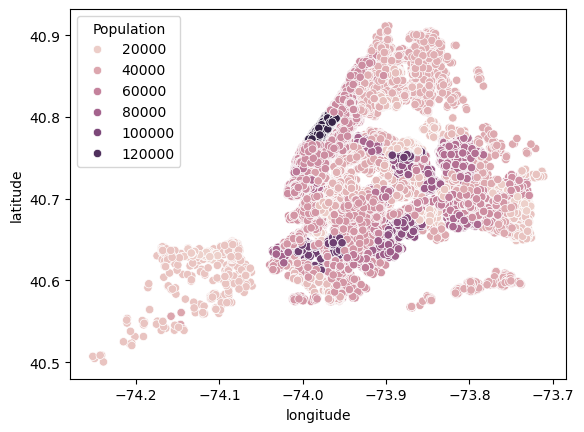

In [86]:
# (8.12) Representamos la "saturación" por barrios a partir de nuestras muestras y su correspondiente población:

sns.scatterplot(x=df_nyc_merged["longitude"], y=df_nyc_merged["latitude"], hue=df_nyc_merged["Population"])

## Ejercicio 9.

El objetivo es automatizar el proceso de análisis exploratorio y limpieza de datos mediante un pipeline, que además mantenga un registro detallado de las métricas clave en cada paso del proceso.
Define y crea un pipeline que incluya:
- Cargar el dataset

- Imputación de valores nulos.

- Discretización de variables escogidas

- Eliminación de columnas con un porcentaje mayor al 85% de valores nulos

In [89]:
# (9.1.1) Carga del DS:

df_pipe = pd.read_csv('./data/NYC-Airbnb-2023.csv')

C:\Users\PC\AppData\Local\Temp\ipykernel_2584\50612240.py:3: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df_pipe = pd.read_csv('./data/NYC-Airbnb-2023.csv')


In [90]:
# (9.1.2) Generemos una copia del DS original

def start(df):
    return df.copy()

In [91]:
# (9.1.3) Dimension de los datos

def shape(df):
    rows=len(df)
    cols=len(df.columns)
    print(f"El DS contiene {rows} instancias de {cols} columnas", "\n")
    return df

In [92]:
# (9.1.4) Infromación del DS

def info(df):
    
    print(df.info(), "\n")
    
    return df

In [93]:
# (9.2.1) Valores nulos por columna

def nulls(df):
    df_nulls= df.isna().sum()
    print("Valores nulos por columna:", df_nulls, "\n")
    return df

In [94]:
# (9.2.2) Antes de rellenar los valores faltantes, eliminamos las columnas con un porcentaje mayor al 85%

def remove_columns(df):
    datos_faltantes_count = df.isnull().sum().sort_values(ascending=False)
    datos_faltantes_count_porcentaje = round((datos_faltantes_count/len(df.axes[0]))*100,2)
    
    df_datos_faltantes=datos_faltantes_count_porcentaje.to_frame()
    df_datos_faltantes.columns = ["Porcentaje"]
    
    col_faltantes = list(df_datos_faltantes[df_datos_faltantes["Porcentaje"]>85].index)
    
    print(f"Se eliminará la columna: {col_faltantes}", "al tener más de 85% de datos faltantes\n")
    
    df.drop(columns=list(col_faltantes),inplace=True)
    
    return df

In [95]:
# (9.2.3) Rellenamos los valos faltantes con 0

def missing_values(df):
    df.fillna(0)
    return df

In [96]:
# (9.3) Discretizamos la variable de precio y la de última reseña (por mes)

def discretize(df):
    
    p_range = [0, 100, 400, 1000, 100000] #Definimos unos rangos de precio (arbitrarios, sin considerar cuartiles, desviaciones, etc.)
    p_cat = ['low', 'mid', 'high', 'luxury'] #Definimos las correspondientes categorías
    df['price_category'] = pd.cut(df['price'], p_range, labels=p_cat) #Generamos la nueva columna

    df["last_review"] = df["last_review"].apply (pd.to_datetime, format = '%Y-%m-%d')
    df["last_review"] = df["last_review"].fillna(df["last_review"].min())
    df["Review Month"] = df["last_review"].dt.month

    print(f"Se añaden nuevas columnas discretizadas price_category y Review Month:")
    
    return df

In [97]:
# (9.4) Lanzamos pipeline

(df_pipe
    .pipe(start)
    .pipe(shape)
    .pipe(info)
    .pipe(nulls)
    .pipe(remove_columns)
    .pipe(missing_values)
    .pipe(discretize)
    .pipe(info)
).head()

El DS contiene 42931 instancias de 18 columnas 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42931 entries, 0 to 42930
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              42931 non-null  int64  
 1   name                            42919 non-null  object 
 2   host_id                         42931 non-null  int64  
 3   host_name                       42926 non-null  object 
 4   neighbourhood_group             42931 non-null  object 
 5   neighbourhood                   42931 non-null  object 
 6   latitude                        42931 non-null  float64
 7   longitude                       42931 non-null  float64
 8   room_type                       42931 non-null  object 
 9   price                           42931 non-null  int64  
 10  minimum_nights                  42931 non-null  int64  
 11  number_of_reviews               42931 non-nu

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,price_category,Review Month
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,mid,6
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,low,12
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,low,7
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,low,2
4,5136,"Large Sunny Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1,mid,8
